In [1]:
pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=640ccdbc60c0ff54398f0be2219d42500bb6b0eb5e1b4eed37131c10f1f76939
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [2]:
import pandas as pd
df = pd.read_csv("/content/Wicket_new.csv")
df.head()

,title,description,label
0,open Modal Window without AjaxRequestTarget,Wicket 1.2.2 included a new Modal Window compo...,0
1,missing base64/ URL encoding,yesterday i showed the concept of omponents to...,0
2,Wrong source paths in build.xml,The paths used in the ant build.xml don't matc...,0
3,WicketTester fails when calling clickLink on a...,Basics of the testcase are:// in WebApplicatio...,0
4,Make debug settings session dependent,Currently the debug settings are global. i.e....,0


In [3]:
# Data Analysis
import pandas as pd
import numpy as np

# Data Visualization
from matplotlib import pyplot as plt
import seaborn as sns

# Machine Learning
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

# NLP
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from wordcloud import WordCloud, STOPWORDS
import re

# Warning
import warnings
warnings.filterwarnings('ignore')

Train and Test CSV files

In [4]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Load your CSV file into a pandas DataFrame
data = pd.read_csv("/content/Wicket_new.csv")

# Split the data into features (X) and target variable (y) assuming the last column is the target variable
X = data.iloc[:, :-1]  # Features
y = data.iloc[:, -1]   # Target variable

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Concatenate features and target variable for training and testing sets
train_data = pd.concat([X_train, y_train], axis=1)
test_data = pd.concat([X_test, y_test], axis=1)

# Save the training and testing data to CSV files
train_data.to_csv("train.csv", index=False)
test_data.to_csv("test.csv", index=False)


In [5]:
# Loading train data
train_df = pd.read_csv('/content/train.csv')
print(f'Train data shape: {train_df.shape}')
train_df.head()

Train data shape: (800, 3)


,title,description,label
0,Calls to enabled and visibleInHierarchy should...,Currently the check(s) on whether a component...,0
1,Reset the busy flag in Wicket.Channel if the e...,If a scheduled (in Wicket.Channel) callback fa...,0
2,Two WicketSerializableException classes,o.a.w.util.io.WicketSerializeableException is ...,0
3,UrlRenderer should not always add '.' to url,The fix in WICKET-3337 introduced a bug: now a...,0
4,wicket-ajax-jquery.js fails with 'member not f...,Channel#done() uses setTimeout() to execute de...,0


In [6]:
# Loading test data
test_df = pd.read_csv('/content/test.csv')
print(f'Test data shape: {test_df.shape}')
test_df.head()

Test data shape: (200, 3)


,title,description,label
0,Can't write session to disk with tomcat : Serv...,Hi When I stop my tomcat I have the following...,0
1,Add Generics to TabbedPanel:,In 1.5 TabbedPanel#tabs has a wildcard signat...,0
2,Component#getMarkupId() generates id that gets...,Component#getMarkupId() generates ids containi...,0
3,RequestHandlerStack: Unnecessary Stacktrace in...,We use session.replaceSession() when a user lo...,0
4,FormComponent.MessageSource.getMessage(String)...,I tried to use the getValidatorKeyPrefix() fea...,0


In [7]:
# Duplicates check
train_df.duplicated().sum()

1

In [8]:
# Data types check
train_df.dtypes

title          object
description    object
label           int64
dtype: object

In [9]:
# Missing values check
print(f'Missing values in train data:\n{train_df.isnull().sum()}')
print('-'*40)
print(f'Missing values in test data:\n{test_df.isnull().sum()}')

Missing values in train data:
title          0
description    0
label          0
dtype: int64
----------------------------------------
Missing values in test data:
title          0
description    0
label          0
dtype: int64


In [10]:
import pandas as pd

# Assuming you have already loaded your train and test DataFrames as train_df and test_df

# Remove missing values from the train DataFrame
train_df = train_df.dropna()

# Remove missing values from the test DataFrame
test_df = test_df.dropna()

# Check if missing values are removed
print(f'Missing values in train data after removal:\n{train_df.isnull().sum()}')
print('-'*40)
print(f'Missing values in test data after removal:\n{test_df.isnull().sum()}')

Missing values in train data after removal:
title          0
description    0
label          0
dtype: int64
----------------------------------------
Missing values in test data after removal:
title          0
description    0
label          0
dtype: int64


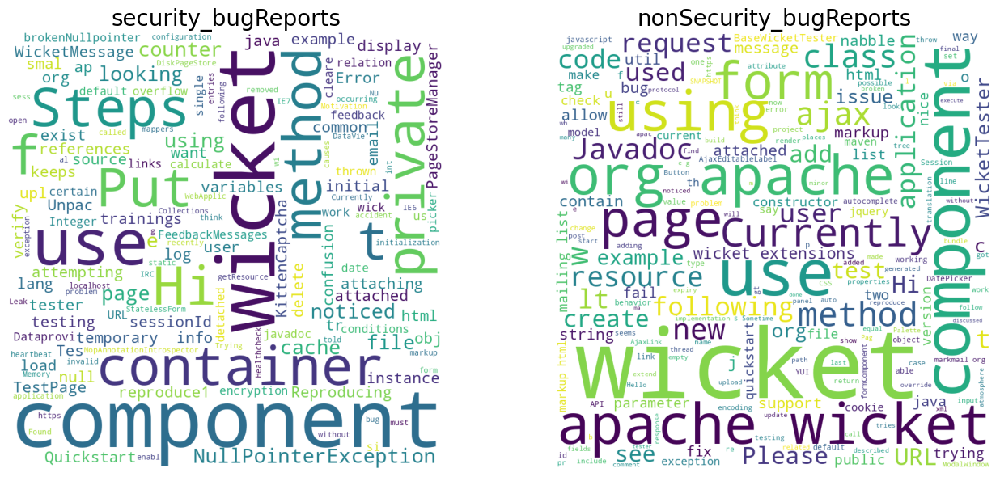

In [11]:
# Plotting wordclouds
stopwords = set(STOPWORDS)

security_bugReports = train_df['description'][train_df['label']==1].to_string()
wordcloud_negative = WordCloud(width = 800, height = 800,
                               background_color ='white', stopwords = stopwords,
                               min_font_size = 10).generate(security_bugReports)

nonSecurity_bugReports = train_df['description'][train_df['label']==0].to_string()
wordcloud_positive = WordCloud(width = 800, height = 800,
                               background_color ='white', stopwords = stopwords,
                               min_font_size = 10).generate(nonSecurity_bugReports)

# Plotting the WordCloud images
plt.figure(figsize=(14, 6), facecolor = None)

plt.subplot(1, 2, 1)
plt.imshow(wordcloud_negative)
plt.axis("off")
plt.title('security_bugReports', fontdict={'fontsize': 20})

plt.subplot(1, 2, 2)
plt.imshow(wordcloud_positive)
plt.axis("off")
plt.title('nonSecurity_bugReports', fontdict={'fontsize': 20})

plt.tight_layout()
plt.show()

Data Preprocessing

In [12]:
# Train-Test Splitting
X = train_df.drop(columns=['label'])
y = train_df['label']
test = test_df
print(X.shape, test.shape, y.shape)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=10)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(800, 2) (200, 3) (800,)
(640, 2) (160, 2) (640,) (160,)


In [13]:
X_train.dtypes

title          object
description    object
dtype: object

Text Normalization

In [14]:
# Function to tokenize and clean the text
def tokenize_and_clean(text):
    # Changing case of the text to lower case
    lowered = text.lower()

    # Cleaning the text
    cleaned = re.sub('@user', '', lowered)

    # Tokenization
    tokens = word_tokenize(cleaned)
    filtered_tokens = [token for token in tokens if re.match(r'\w{1,}', token)]

    # Stemming
    stemmer = PorterStemmer()
    stems = [stemmer.stem(token) for token in filtered_tokens]
    return stems

**Vectorization**

In [15]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [16]:
# BOW Vectorization

# TF-IDF Vectorization
tfidf_vectorizer = TfidfVectorizer(tokenizer=tokenize_and_clean, stop_words='english')
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train['description'])
X_test_tfidf = tfidf_vectorizer.transform(X_test['description'])
print(X_train_tfidf.shape, X_test_tfidf.shape)

# TF-IDF Vectorization on full training data
tfidf_vectorizer_full = TfidfVectorizer(tokenizer=tokenize_and_clean, stop_words='english')
X_tfidf = tfidf_vectorizer_full.fit_transform(X['description'])
test_tfidf = tfidf_vectorizer_full.transform(test['description'])
print(X_tfidf.shape, test_tfidf.shape)

(640, 7061) (160, 7061)
(800, 8250) (200, 8250)


**SMOTE**

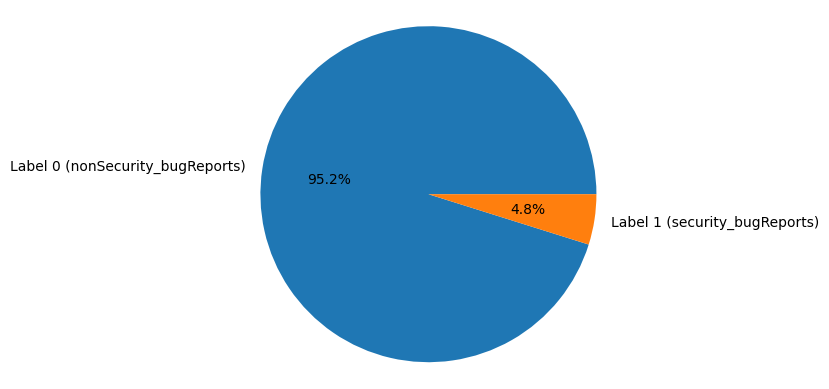

In [17]:
# Class Imbalance Check
plt.pie(y_train.value_counts(),
        labels=['Label 0 (nonSecurity_bugReports)', 'Label 1 (security_bugReports)'],
        autopct='%0.1f%%')
plt.axis('equal')
plt.show()

(1218, 7061) (1218,)
(1524, 8250) (1524,)


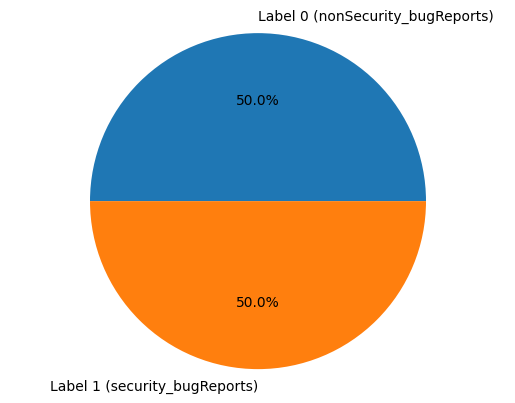

In [18]:
# SMOTE to deal with the class imbalance
smote = SMOTE()
X_train_smote, y_train_smote = smote.fit_resample(X_train_tfidf, y_train.values)
print(X_train_smote.shape, y_train_smote.shape)

# SMOTE on full training data
smote = SMOTE()
X_smote, y_smote = smote.fit_resample(X_tfidf, y.values)
print(X_smote.shape, y_smote.shape)

# Class Imbalance Check
plt.pie(pd.value_counts(y_train_smote),
        labels=['Label 0 (nonSecurity_bugReports)', 'Label 1 (security_bugReports)'],
        autopct='%0.1f%%')
plt.axis('equal')
plt.show()

ML **Modeling**

In [19]:
# Functions to print scores
def training_scores(y_act, y_pred):
    acc = round(accuracy_score(y_act, y_pred), 3)
    f1 = round(f1_score(y_act, y_pred), 3)
    print(f'Training Scores: Accuracy={acc}, F1-Score={f1}')

def validation_scores(y_act, y_pred):
    acc = round(accuracy_score(y_act, y_pred), 3)
    f1 = round(f1_score(y_act, y_pred), 3)
    print(f'Validation Scores: Accuracy={acc}, F1-Score={f1}')

In [20]:
# Logistic Regression
lr = LogisticRegression()
lr.fit(X_train_smote, y_train_smote)
y_train_pred = lr.predict(X_train_smote)
y_test_pred = lr.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=1.0, F1-Score=1.0
Validation Scores: Accuracy=0.956, F1-Score=0.364


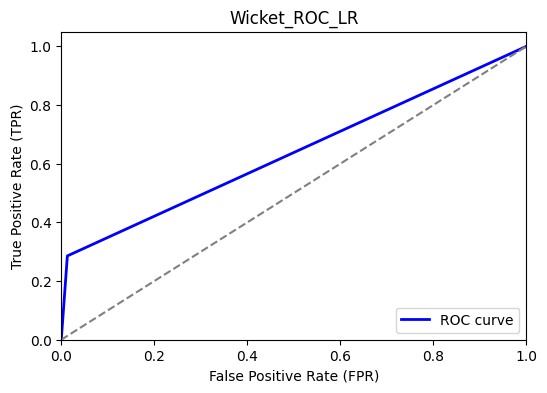

In [21]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Wicket_ROC_LR')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Wicket_ROC_LR.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

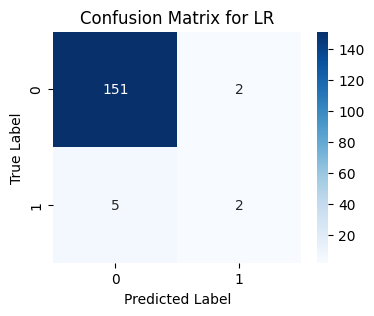

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score, roc_curve, confusion_matrix

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_test, y_test_pred)

# Plot the confusion matrix
plt.figure(figsize=(4, 3))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix for LR')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.savefig('confusion_matrix_lr.png', bbox_inches='tight')

plt.show()

--------------------------**LIME for Logistic Regression**----------------------

In [23]:
from lime.lime_text import LimeTextExplainer
class_names = list(train_df.label.unique())
explainer = LimeTextExplainer(class_names=class_names)

In [24]:
max_features = train_df.description.str.split().map(lambda x: len(x)).max()
print(max_features)

569


In [25]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, lr)

In [26]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

42


In [27]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.84335447 0.15664553]]

Explanation as a list of weighted features


[('outdated', -0.007999696727821344),
 ('properties', 5.9759149281440055e-06),
 ('application_nl', 5.922704091731967e-06),
 ('is', 5.785388834479758e-06)]

In [28]:
[test.title.iloc[idx]]

['application_nl.properties is outdated']

In [29]:
exp.show_in_notebook(text=True)

In [30]:
# Naive Bayes Classifier
mnb = MultinomialNB()
mnb.fit(X_train_smote, y_train_smote)
y_train_pred = mnb.predict(X_train_smote)
y_test_pred = mnb.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=0.987, F1-Score=0.987
Validation Scores: Accuracy=0.881, F1-Score=0.345


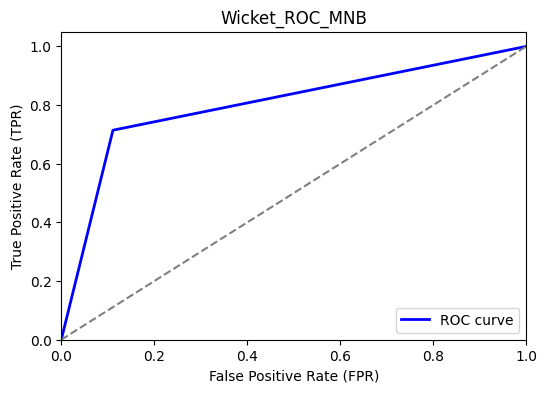

In [31]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Wicket_ROC_MNB')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Wicket_ROC_MNB.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

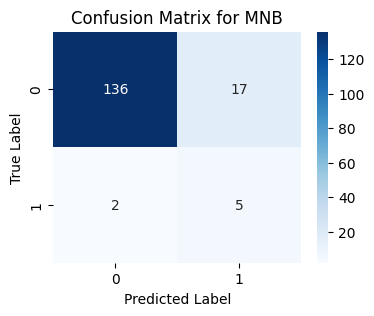

In [32]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score, roc_curve, confusion_matrix

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_test, y_test_pred)

# Plot the confusion matrix
plt.figure(figsize=(4, 3))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix for MNB')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.savefig('confusion_matrix_mnb.png', bbox_inches='tight')

plt.show()

--------------------------**LIME for Naive Bayes**----------------------

In [33]:
from lime.lime_text import LimeTextExplainer
class_names = list(train_df.label.unique())
explainer = LimeTextExplainer(class_names=class_names)

In [34]:
max_features = train_df.description.str.split().map(lambda x: len(x)).max()
print(max_features)

569


In [35]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, mnb)

In [36]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

42


In [37]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.60119563 0.39880437]]

Explanation as a list of weighted features


[('outdated', -0.10092607351944888),
 ('properties', 7.278187579716665e-05),
 ('is', 7.211122590860214e-05),
 ('application_nl', 6.792450881696898e-05)]

In [38]:
[test.title.iloc[idx]]

['application_nl.properties is outdated']

In [39]:
exp.show_in_notebook(text=True)

In [40]:
# Random Forest Classifier
rf = RandomForestClassifier()
rf.fit(X_train_smote, y_train_smote)
y_train_pred = rf.predict(X_train_smote)
y_test_pred = rf.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=1.0, F1-Score=1.0
Validation Scores: Accuracy=0.956, F1-Score=0.0


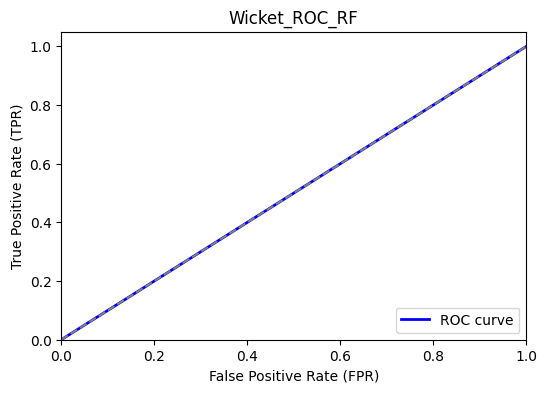

In [41]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Wicket_ROC_RF')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Wicket_ROC_RF.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

In [42]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score, roc_curve, confusion_matrix

precision = precision_score(y_test, y_test_pred)
recall = recall_score(y_test, y_test_pred)
roc_auc = roc_auc_score(y_test, y_test_pred)
f1score = f1_score(y_test,y_test_pred)
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

print("Precision:", precision)
print("Recall:", recall)
print("ROC AUC:", roc_auc)
print("F1 Score:", f1score)

Precision: 0.0
Recall: 0.0
ROC AUC: 0.5
F1 Score: 0.0


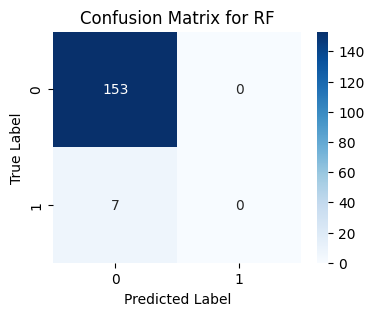

In [43]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score, roc_curve, confusion_matrix

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_test, y_test_pred)

# Plot the confusion matrix
plt.figure(figsize=(4, 3))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix for RF')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.savefig('confusion_matrix_rf.png', bbox_inches='tight')

plt.show()

----------------------**lime for Random Forest Classifier**---------------------

In [44]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, rf)

In [45]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

42


In [46]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[1. 0.]]

Explanation as a list of weighted features


[('application_nl', 0.0), ('properties', 0.0), ('is', 0.0), ('outdated', 0.0)]

In [47]:
[test.title.iloc[idx]]

['application_nl.properties is outdated']

In [48]:
exp.show_in_notebook(text=True)

In [49]:
# Extreme Gradient Boosting Classifier
xgb = XGBClassifier(objective='binary:logistic', eval_metric='logloss')
xgb.fit(X_train_smote, y_train_smote)
y_train_pred = xgb.predict(X_train_smote)
y_test_pred = xgb.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=1.0, F1-Score=1.0
Validation Scores: Accuracy=0.956, F1-Score=0.222


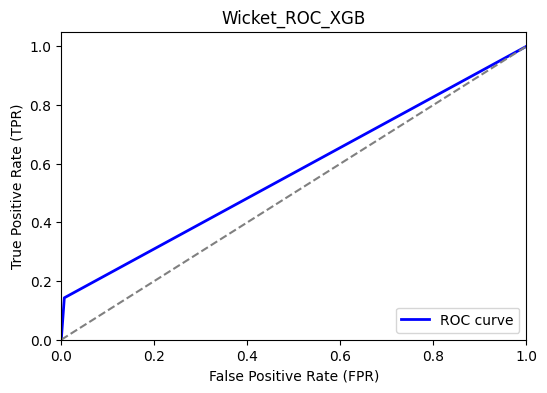

In [50]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Wicket_ROC_XGB')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Wicket_ROC_XGB.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

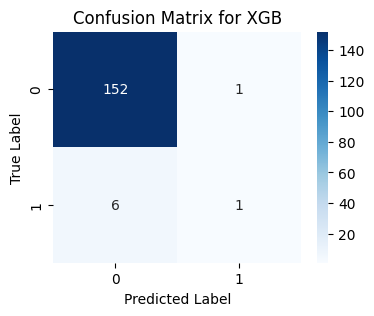

In [51]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score, roc_curve, confusion_matrix

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_test, y_test_pred)

# Plot the confusion matrix
plt.figure(figsize=(4, 3))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix for XGB')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.savefig('confusion_matrix_xgb.png', bbox_inches='tight')

plt.show()

---------------------**lime for Extreme Gradient Boosting**---------------------

In [52]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, xgb)

In [53]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

42


In [54]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.99839395 0.00160604]]

Explanation as a list of weighted features


[('application_nl', -4.5830348281171425e-35),
 ('outdated', 3.7316533145294997e-35),
 ('is', -3.028388964537265e-35),
 ('properties', 1.9726018002221712e-35)]

In [55]:
[test.title.iloc[idx]]

['application_nl.properties is outdated']

In [56]:
exp.show_in_notebook(text=True)

In [57]:
pip install lime

**SMOTE WITH 60:40 RATIO**

(974, 7061) (974,)
(1524, 8250) (1524,)


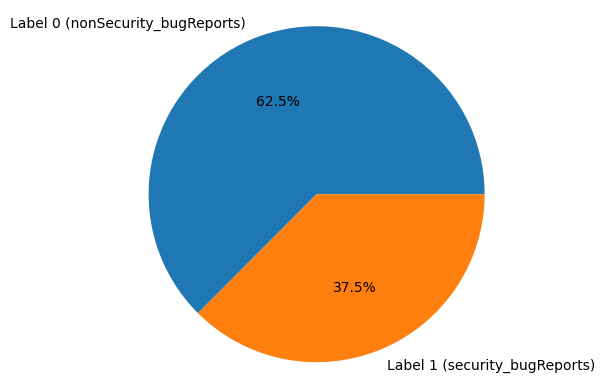

In [58]:
# SMOTE to deal with the class imbalance
smote = SMOTE(sampling_strategy=0.6)
X_train_smote, y_train_smote = smote.fit_resample(X_train_tfidf, y_train.values)
print(X_train_smote.shape, y_train_smote.shape)

# SMOTE on full training data
smote = SMOTE()
X_smote, y_smote = smote.fit_resample(X_tfidf, y.values)
print(X_smote.shape, y_smote.shape)

# Class Imbalance Check
plt.pie(pd.value_counts(y_train_smote),
        labels=['Label 0 (nonSecurity_bugReports)', 'Label 1 (security_bugReports)'],
        autopct='%0.1f%%')
plt.axis('equal')
plt.show()

In [59]:
# Functions to print scores
def training_scores(y_act, y_pred):
    acc = round(accuracy_score(y_act, y_pred), 3)
    f1 = round(f1_score(y_act, y_pred), 3)
    print(f'Training Scores: Accuracy={acc}, F1-Score={f1}')

def validation_scores(y_act, y_pred):
    acc = round(accuracy_score(y_act, y_pred), 3)
    f1 = round(f1_score(y_act, y_pred), 3)
    print(f'Validation Scores: Accuracy={acc}, F1-Score={f1}')

In [60]:
# Logistic Regression
lr = LogisticRegression()
lr.fit(X_train_smote, y_train_smote)
y_train_pred = lr.predict(X_train_smote)
y_test_pred = lr.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=0.999, F1-Score=0.999
Validation Scores: Accuracy=0.956, F1-Score=0.364


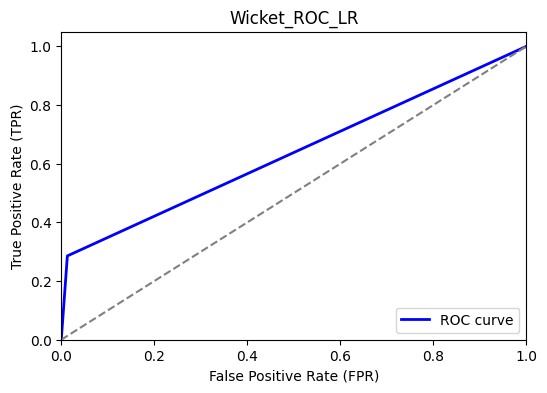

In [61]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Wicket_ROC_LR')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Wicket_ROC_LR_r2.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

---------------------**lime for Logistic Regression**---------------------

In [62]:
from lime.lime_text import LimeTextExplainer
class_names = list(train_df.label.unique())
explainer = LimeTextExplainer(class_names=class_names)

In [63]:
max_features = train_df.description.str.split().map(lambda x: len(x)).max()
print(max_features)

569


In [64]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, lr)

In [65]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

42


In [66]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.86490937 0.13509063]]

Explanation as a list of weighted features


[('outdated', -0.006324140086439008),
 ('is', 4.762465475850433e-06),
 ('application_nl', 4.697121142792888e-06),
 ('properties', 4.379009364562168e-06)]

In [67]:
[test.title.iloc[idx]]

['application_nl.properties is outdated']

In [68]:
exp.show_in_notebook(text=True)

In [69]:
# Naive Bayes Classifier
mnb = MultinomialNB()
mnb.fit(X_train_smote, y_train_smote)
y_train_pred = mnb.predict(X_train_smote)
y_test_pred = mnb.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=0.999, F1-Score=0.999
Validation Scores: Accuracy=0.969, F1-Score=0.615


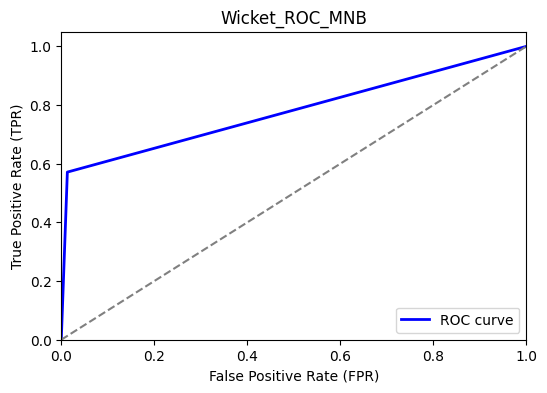

In [70]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Wicket_ROC_MNB')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Wicket_ROC_MNB_r2.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

----------------------------**lime for Naive Bayes**----------------------------

In [71]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, mnb)

In [72]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

42


In [73]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.68463363 0.31536637]]

Explanation as a list of weighted features


[('outdated', -0.05921962107878395),
 ('properties', 4.656002903840666e-05),
 ('application_nl', 4.580160063886952e-05),
 ('is', 3.945876999301809e-05)]

In [74]:
[test.title.iloc[idx]]

['application_nl.properties is outdated']

In [75]:
exp.show_in_notebook(text=True)

In [76]:
# Random Forest Classifier
rf = RandomForestClassifier()
rf.fit(X_train_smote, y_train_smote)
y_train_pred = rf.predict(X_train_smote)
y_test_pred = rf.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=1.0, F1-Score=1.0
Validation Scores: Accuracy=0.956, F1-Score=0.0


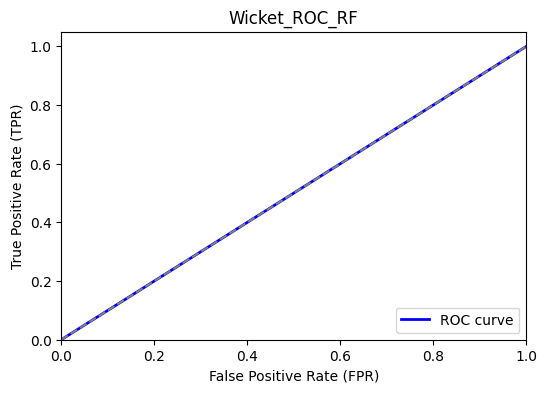

In [77]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Wicket_ROC_RF')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Wicket_ROC_RF_r2.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

----------------------**lime for Random Forest Classifier**---------------------

In [78]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, rf)

In [79]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

42


In [80]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[1. 0.]]

Explanation as a list of weighted features


[('application_nl', 0.0), ('properties', 0.0), ('is', 0.0), ('outdated', 0.0)]

In [81]:
[test.title.iloc[idx]]

['application_nl.properties is outdated']

In [82]:
exp.show_in_notebook(text=True)

In [83]:
# Extreme Gradient Boosting Classifier
xgb = XGBClassifier(objective='binary:logistic', eval_metric='logloss')
xgb.fit(X_train_smote, y_train_smote)
y_train_pred = xgb.predict(X_train_smote)
y_test_pred = xgb.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=0.999, F1-Score=0.999
Validation Scores: Accuracy=0.956, F1-Score=0.222


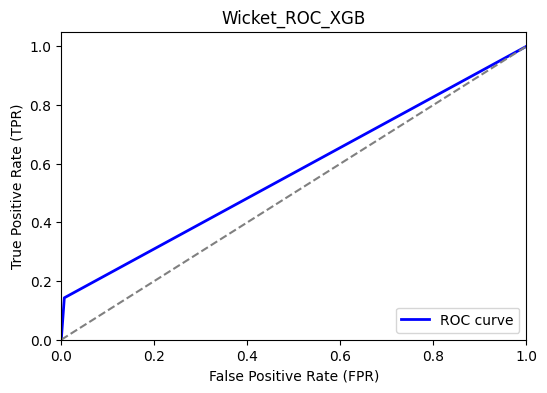

In [84]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Wicket_ROC_XGB')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Wicket_ROC_XGB_r2.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

---------------------**lime for Extreme Gradient Boosting**---------------------

In [85]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, xgb)

In [86]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

42


In [87]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.9979627  0.00203731]]

Explanation as a list of weighted features


[('application_nl', 0.0), ('properties', 0.0), ('is', 0.0), ('outdated', 0.0)]

In [88]:
[test.title.iloc[idx]]

['application_nl.properties is outdated']

In [89]:
exp.show_in_notebook(text=True)